In [9]:
from tensorflow.keras.layers import Input, Dense, Dropout, TimeDistributed, RepeatVector
from tensorflow.keras.models import Model
from tensorflow.keras.applications import EfficientNetB6
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import Sequence
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
import numpy as np
import pandas as pd
import os
import cv2
import xml.etree.ElementTree as ET
from PIL import Image
import math
import tensorflow as tf

In [10]:
def load_rdd2022_dataset(root_folder):
    data = []
    for country_1 in os.listdir(root_folder):
        path_1 = os.path.join(root_folder, country_1)
        if not os.path.isdir(path_1): continue
        for country_2 in os.listdir(path_1):
            path_2 = os.path.join(path_1, country_2)
            if not os.path.isdir(path_2): continue
            train_path = os.path.join(path_2, 'train')
            images_path = os.path.join(train_path, 'images')
            annotations_path = os.path.join(train_path, 'annotations', 'xmls')
            if not os.path.exists(images_path) or not os.path.exists(annotations_path): continue
            for xml_file in os.listdir(annotations_path):
                if not xml_file.endswith('.xml'): continue
                xml_path = os.path.join(annotations_path, xml_file)
                try:
                    tree = ET.parse(xml_path)
                    root = tree.getroot()
                    filename = root.find('filename').text
                    img_path = os.path.join(images_path, filename)
                    for obj in root.findall('object'):
                        label = obj.find('name').text.strip()
                        bbox = obj.find('bndbox')
                        xmin = int(float(bbox.find('xmin').text))
                        ymin = int(float(bbox.find('ymin').text))
                        xmax = int(float(bbox.find('xmax').text))
                        ymax = int(float(bbox.find('ymax').text))
                        data.append([img_path, xmin, ymin, xmax, ymax, label])
                except Exception as e:
                    print(f'❌ Error en {xml_path}: {e}')
    df = pd.DataFrame(data, columns=['image_path', 'xmin', 'ymin', 'xmax', 'ymax', 'label'])
    print(f"✅ RDD2022 dataset cargado: {len(df)} muestras")
    return df

In [11]:
def load_humans_dataset(root_folder):
    data = []
    for split in ['train', 'val']:
        images_path = os.path.join(root_folder, 'images', split)
        labels_path = os.path.join(root_folder, 'labels', split)
        if not os.path.exists(images_path) or not os.path.exists(labels_path): continue
        for label_file in os.listdir(labels_path):
            if not label_file.endswith('.txt'): continue
            label_path = os.path.join(labels_path, label_file)
            img_filename = os.path.splitext(label_file)[0] + '.jpg'
            img_path = os.path.join(images_path, img_filename)
            if not os.path.exists(img_path):
                img_filename = os.path.splitext(label_file)[0] + '.png'
                img_path = os.path.join(images_path, img_filename)
                if not os.path.exists(img_path):
                    print(f"⚠️ Imagen no encontrada para {label_path}")
                    continue
            with Image.open(img_path) as img:
                width, height = img.size
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) != 5: continue
                    class_id = parts[0]
                    x_center_rel = float(parts[1])
                    y_center_rel = float(parts[2])
                    width_rel = float(parts[3])
                    height_rel = float(parts[4])
                    xmin = int((x_center_rel - width_rel / 2) * width)
                    ymin = int((y_center_rel - height_rel / 2) * height)
                    xmax = int((x_center_rel + width_rel / 2) * width)
                    ymax = int((y_center_rel + height_rel / 2) * height)
                    data.append([img_path, xmin, ymin, xmax, ymax, class_id])
    df = pd.DataFrame(data, columns=['image_path', 'xmin', 'ymin', 'xmax', 'ymax', 'label'])
    print(f"✅ Humans dataset cargado: {len(df)} muestras")
    return df


In [12]:
def load_voc2012_dataset(root_folder):
    images_path = os.path.join(root_folder, 'JPEGImages')
    annotations_path = os.path.join(root_folder, 'Annotations')
    data = []
    for xml_file in os.listdir(annotations_path):
        if not xml_file.endswith('.xml'): continue
        xml_path = os.path.join(annotations_path, xml_file)
        try:
            tree = ET.parse(xml_path)
            root = tree.getroot()
            filename = root.find('filename').text
            img_path = os.path.join(images_path, filename)
            for obj in root.findall('object'):
                label = obj.find('name').text.strip().lower()
                if label in ['person', 'human']:
                    class_id = 0
                else:
                    class_id = 1
                bbox = obj.find('bndbox')
                xmin = int(float(bbox.find('xmin').text))
                ymin = int(float(bbox.find('ymin').text))
                xmax = int(float(bbox.find('xmax').text))
                ymax = int(float(bbox.find('ymax').text))
                data.append([img_path, xmin, ymin, xmax, ymax, class_id])
        except Exception as e:
            print(f"❌ Error en {xml_path}: {e}")
    df = pd.DataFrame(data, columns=['image_path', 'xmin', 'ymin', 'xmax', 'ymax', 'label'])
    print(f"✅ VOC2012 dataset cargado: {len(df)} muestras")
    print(df['label'].value_counts())
    return df



In [13]:
def unify_labels(df, person_labels=set(['person', 'human', 0])):
    def map_label(label):
        if label in person_labels or str(label).lower() in person_labels:
            return 0
        return label
    df['label'] = df['label'].apply(map_label)
    return df

In [14]:
# --------------------------
# 2. DataGenerator corregido
# --------------------------

class MultiBoxDataGenerator(Sequence):
    def __init__(self, df, batch_size=4, img_size=(528, 528), shuffle=True, class_to_idx=None, max_boxes=4):
        self.df = df
        self.batch_size = batch_size
        self.img_size = img_size
        self.shuffle = shuffle
        self.max_boxes = max_boxes
        self.class_to_idx = class_to_idx or {name: idx for idx, name in enumerate(sorted(self.df['label'].unique()))}
        self.groups = df.groupby('image_path')
        self.image_paths = list(self.groups.groups.keys())
        self.on_epoch_end()

    def __len__(self):
        return math.ceil(len(self.image_paths) / self.batch_size)

    def on_epoch_end(self):
        self.indices = np.arange(len(self.image_paths))
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __getitem__(self, index):
        batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]
        batch_image_paths = [self.image_paths[i] for i in batch_indices]
        
        images = []
        batch_bboxes = []
        batch_labels = []

        for img_path in batch_image_paths:
            img = cv2.imread(img_path)
            if img is None:
                print(f"⚠️ Imagen no encontrada: {img_path}")
                continue  # <-- Esto es peligroso
                # en vez de continuar, debes poner cajas vacías

            original_h, original_w = img.shape[:2]
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            img_resized = cv2.resize(img, self.img_size)
            img_resized = preprocess_input(img_resized.astype(np.float32))

            boxes = []
            labels = []

            if img_path in self.groups.groups:
                annotations = self.groups.get_group(img_path)
                for _, row in annotations.iterrows():
                    x_min = row['xmin'] / original_w
                    y_min = row['ymin'] / original_h
                    x_max = row['xmax'] / original_w
                    y_max = row['ymax'] / original_h
                    boxes.append([x_min, y_min, x_max, y_max])
                    labels.append(self.class_to_idx[row['label']])
            
            # Rellenar o truncar
            if len(boxes) > self.max_boxes:
                boxes = boxes[:self.max_boxes]
                labels = labels[:self.max_boxes]
            else:
                while len(boxes) < self.max_boxes:
                    boxes.append([0, 0, 0, 0])
                    labels.append(3)

            images.append(img_resized)
            batch_bboxes.append(boxes)
            batch_labels.append(labels)

        # ✅ Forzar que el batch tenga tamaño constante
        while len(images) < self.batch_size:
            images.append(np.zeros((*self.img_size, 3), dtype=np.float32))
            batch_bboxes.append([[0, 0, 0, 0]] * self.max_boxes)
            batch_labels.append([-1] * self.max_boxes)

        return np.array(images), {
            'bbox': np.array(batch_bboxes, dtype=np.float32),
            'class': np.array(batch_labels, dtype=np.int32)
        }
        


In [15]:
rdd_root = r'C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\AI_model\datasets\Segmentation\RDD2022'
humans_root = r'C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\AI_model\datasets\Segmentation\humans'
voc_root = r'C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\AI_model\datasets\Segmentation\VOCdevkit\VOC2012'

print("⏳ Cargando datasets...")
df_rdd = load_rdd2022_dataset(rdd_root)
df_humans = load_humans_dataset(humans_root)
df_voc = load_voc2012_dataset(voc_root)

df_humans = unify_labels(df_humans, person_labels=set([0]))
df_voc = unify_labels(df_voc, person_labels=set(['person', 'human', 0]))

df = pd.concat([df_rdd, df_humans, df_voc], ignore_index=True)

clases_a_eliminar = ['block crack', 'd0w0']
df = df[~df['label'].astype(str).str.lower().isin(clases_a_eliminar)].reset_index(drop=True)

df['label'] = df['label'].astype(str)
df['label'] = df['label'].replace({'0': 0})

dfs = []
n_samples = 15000
for label in df['label'].unique():
    subset = df[df['label'] == label]
    if len(subset) > n_samples:
        subset = resample(subset, replace=False, n_samples=n_samples, random_state=42)
    dfs.append(subset)
df_balanced = pd.concat(dfs).sample(frac=1, random_state=42).reset_index(drop=True)

print("✅ Dataset final filtrado y balanceado:")
print(df_balanced['label'].value_counts())

unique_labels = df_balanced['label'].unique()
class_to_idx = {}
idx = 0
class_to_idx[0] = 0  # persona
for label in unique_labels:
    if label != 0:
        class_to_idx[label] = idx + 1
        idx += 1

print("📌 Diccionario único de clases a índices:")
print(class_to_idx)


⏳ Cargando datasets...
✅ RDD2022 dataset cargado: 65712 muestras
✅ Humans dataset cargado: 51846 muestras
✅ VOC2012 dataset cargado: 40138 muestras
label
1    22737
0    17401
Name: count, dtype: int64
✅ Dataset final filtrado y balanceado:
label
D00       15000
0         15000
1         15000
D10       11830
D20       10617
D40        6544
D44        5057
D50        3581
Repair     1046
D43         793
D01         179
D11          45
Name: count, dtype: int64
📌 Diccionario único de clases a índices:
{0: 0, 'D00': 1, 'D40': 2, '1': 3, 'D50': 4, 'D20': 5, 'D10': 6, 'D44': 7, 'Repair': 8, 'D43': 9, 'D01': 10, 'D11': 11}


In [16]:
# --------------------------
# 4. Dividir en entrenamiento y validación
# --------------------------

df_train, df_val = train_test_split(df_balanced, test_size=0.2, random_state=42)
print(f"Muestras entrenamiento: {len(df_train)}")
print(f"Muestras validación: {len(df_val)}")

train_gen = MultiBoxDataGenerator(df_train, batch_size=4, img_size=(528, 528), class_to_idx=class_to_idx, max_boxes=4)
val_gen = MultiBoxDataGenerator(df_val, batch_size=4, img_size=(528, 528), class_to_idx=class_to_idx, max_boxes=4)

num_classes = len(class_to_idx)
print(f"Número de clases: {num_classes}")

Muestras entrenamiento: 67753
Muestras validación: 16939
Número de clases: 12


In [17]:
# --------------------------
# 5. Crear el modelo MobileNetV2 con capas descongeladas
# --------------------------


max_boxes = 4
num_classes = len(class_to_idx)

input_tensor = Input(shape=(528, 528, 3))
base_model = EfficientNetB6(include_top=False, weights='imagenet', input_tensor=input_tensor, pooling='avg')

for layer in base_model.layers:
    layer.trainable = False

for layer in base_model.layers[-20:]:
    layer.trainable = True

x = base_model.output
x = Dropout(0.3)(x)
x = RepeatVector(max_boxes)(x)

bbox_output = TimeDistributed(Dense(4), name='bbox')(x)
class_output = TimeDistributed(Dense(num_classes, activation='softmax'), name='class')(x)

model = Model(inputs=input_tensor, outputs=[bbox_output, class_output])

model.compile(
    optimizer=Adam(1e-4),
    loss={
        'bbox': 'mse',
        'class': 'sparse_categorical_crossentropy'  
    },
    metrics={
        'class': 'accuracy' 
    }
)

In [18]:
# --------------------------
# 6. Entrenamiento
# --------------------------


early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,
    callbacks=[early_stop],
    verbose=2
)

print("✅ Entrenamiento finalizado")



c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30


InvalidArgumentError: Graph execution error:

Detected at node compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits defined at (most recent call last):
  File "C:\Users\marco\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 196, in _run_module_as_main

  File "C:\Users\marco\AppData\Local\Programs\Python\Python310\lib\runpy.py", line 86, in _run_code

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\ipykernel_launcher.py", line 18, in <module>

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\traitlets\config\application.py", line 1075, in launch_instance

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\ipykernel\kernelapp.py", line 739, in start

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\tornado\platform\asyncio.py", line 211, in start

  File "C:\Users\marco\AppData\Local\Programs\Python\Python310\lib\asyncio\base_events.py", line 603, in run_forever

  File "C:\Users\marco\AppData\Local\Programs\Python\Python310\lib\asyncio\base_events.py", line 1906, in _run_once

  File "C:\Users\marco\AppData\Local\Programs\Python\Python310\lib\asyncio\events.py", line 80, in _run

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\ipykernel\kernelbase.py", line 545, in dispatch_queue

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\ipykernel\kernelbase.py", line 534, in process_one

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\ipykernel\kernelbase.py", line 437, in dispatch_shell

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\ipykernel\ipkernel.py", line 362, in execute_request

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\ipykernel\kernelbase.py", line 778, in execute_request

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\ipykernel\ipkernel.py", line 449, in do_execute

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\ipykernel\zmqshell.py", line 549, in run_cell

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\IPython\core\interactiveshell.py", line 3077, in run_cell

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\IPython\core\interactiveshell.py", line 3132, in _run_cell

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\IPython\core\async_helpers.py", line 128, in _pseudo_sync_runner

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\IPython\core\interactiveshell.py", line 3336, in run_cell_async

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\IPython\core\interactiveshell.py", line 3519, in run_ast_nodes

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\IPython\core\interactiveshell.py", line 3579, in run_code

  File "C:\Users\marco\AppData\Local\Temp\ipykernel_32996\66756959.py", line 8, in <module>

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\utils\traceback_utils.py", line 117, in error_handler

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\backend\tensorflow\trainer.py", line 377, in fit

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\backend\tensorflow\trainer.py", line 220, in function

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\backend\tensorflow\trainer.py", line 133, in multi_step_on_iterator

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\backend\tensorflow\trainer.py", line 114, in one_step_on_data

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\backend\tensorflow\trainer.py", line 61, in train_step

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\trainers\trainer.py", line 383, in _compute_loss

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\trainers\trainer.py", line 351, in compute_loss

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\trainers\compile_utils.py", line 690, in __call__

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\trainers\compile_utils.py", line 797, in call

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\losses\loss.py", line 67, in __call__

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\losses\losses.py", line 33, in call

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\losses\losses.py", line 2330, in sparse_categorical_crossentropy

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\ops\nn.py", line 2000, in sparse_categorical_crossentropy

  File "c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\backend\tensorflow\nn.py", line 753, in sparse_categorical_crossentropy

Received a label value of -1 which is outside the valid range of [0, 12).  Label values: 6 3 3 3 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
	 [[{{node compile_loss/sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits}}]] [Op:__inference_multi_step_on_iterator_48677]

In [ ]:
from sklearn.metrics import classification_report
import numpy as np


def evaluate_classification_report(model, val_gen):
    y_true = []
    y_pred = []

    for i in range(len(val_gen)):
        images, labels = val_gen[i]
        class_true = labels['class']

        preds = model.predict(images, verbose=0)
        class_preds_probs = preds[1]  # Asegúrate que el modelo devuelve [bbox_preds, class_preds]
        class_preds = np.argmax(class_preds_probs, axis=1)

        y_true.extend(class_true.tolist())  # ✅ Convertir a lista para evitar problemas
        y_pred.extend(class_preds.tolist())

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Nombres de clases
    class_names = [str(name) for name, idx in sorted(val_gen.class_to_idx.items(), key=lambda x: x[1])]
    all_labels = list(range(len(class_names)))

    print("📊 Reporte de clasificación:")
    print(classification_report(
        y_true,
        y_pred,
        labels=all_labels,
        target_names=class_names,
        digits=4,
        zero_division=0
    ))


# Llamar a la función
evaluate_classification_report(model, val_gen)


📊 Reporte de clasificación:
              precision    recall  f1-score   support

           0     0.8922    0.8498    0.8705      2970
         D00     0.5915    0.6530    0.6208      3009
         D40     0.6940    0.4322    0.5327      1291
           1     0.8577    0.8963    0.8766      2999
         D50     0.4239    0.2011    0.2728       706
         D20     0.4172    0.5644    0.4797      2160
         D10     0.4894    0.4339    0.4600      2392
         D44     0.4608    0.4750    0.4678      1002
      Repair     0.6697    0.7053    0.6871       207
         D43     0.4444    0.5153    0.4773       163
         D01     0.3750    0.3636    0.3692        33
         D11     0.0000    0.0000    0.0000         7

    accuracy                         0.6407     16939
   macro avg     0.5263    0.5075    0.5095     16939
weighted avg     0.6467    0.6407    0.6376     16939



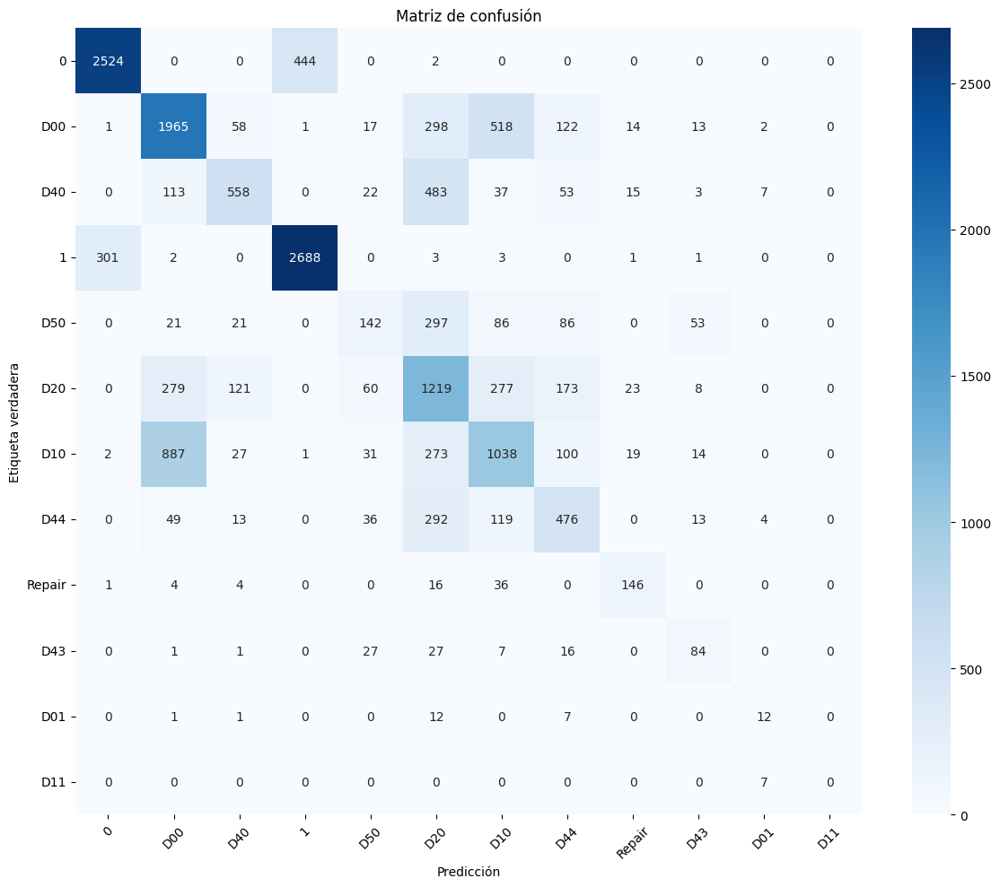

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_confusion_matrix(model, val_gen):
    y_true = []
    y_pred = []

    for i in range(len(val_gen)):
        images, labels = val_gen[i]
        class_true = labels['class']
        class_probs = model.predict(images, verbose=0)[1]
        class_preds = np.argmax(class_probs, axis=1)

        y_true.extend(class_true)
        y_pred.extend(class_preds)

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    class_names = [name for name, idx in sorted(val_gen.class_to_idx.items(), key=lambda x: x[1])]
    cm = confusion_matrix(y_true, y_pred, labels=list(range(len(class_names))))

    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicción')
    plt.ylabel('Etiqueta verdadera')
    plt.title('Matriz de confusión')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

# Usar la función
plot_confusion_matrix(model, val_gen)


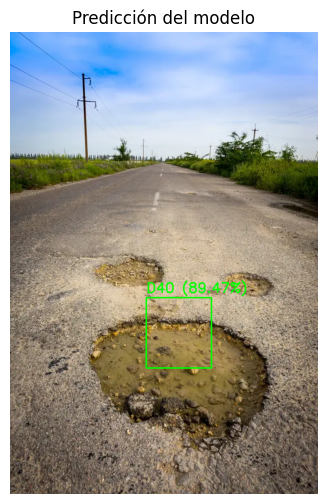

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def predict_on_image(image_path, model, class_to_idx, img_size=(224, 224)):
    idx_to_class = {v: k for k, v in class_to_idx.items()}

    # Leer y preparar imagen
    img = cv2.imread(image_path)
    if img is None:
        print(f"❌ No se pudo leer la imagen: {image_path}")
        return

    original = img.copy()
    original_h, original_w = img.shape[:2]

    # Preprocesar
    img_resized = cv2.resize(img, img_size)
    img_normalized = img_resized.astype(np.float32) / 255.0
    img_input = np.expand_dims(img_normalized, axis=0)  # batch dimension

    # Hacer predicción
    bbox_pred, class_probs = model.predict(img_input, verbose=0)
    bbox_pred = bbox_pred[0]  # (4,)
    class_probs = class_probs[0]  # (num_classes,)

    class_idx = np.argmax(class_probs)
    class_name = idx_to_class[class_idx]
    confidence = class_probs[class_idx] * 100

    # Bounding box (escalado a tamaño original)
    x_min = int(bbox_pred[0] * original_w)
    y_min = int(bbox_pred[1] * original_h)
    x_max = int(bbox_pred[2] * original_w)
    y_max = int(bbox_pred[3] * original_h)

    # Dibujar resultado
    cv2.rectangle(original, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
    label_text = f"{class_name} ({confidence:.2f}%)"
    cv2.putText(original, label_text, (x_min, y_min - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Mostrar imagen
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Predicción del modelo")
    plt.show()

# Ejemplo de uso
ruta_imagen = r"C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\AI_model\IMG\agujero.webp"
predict_on_image(ruta_imagen, model, class_to_idx, img_size=(224, 224))


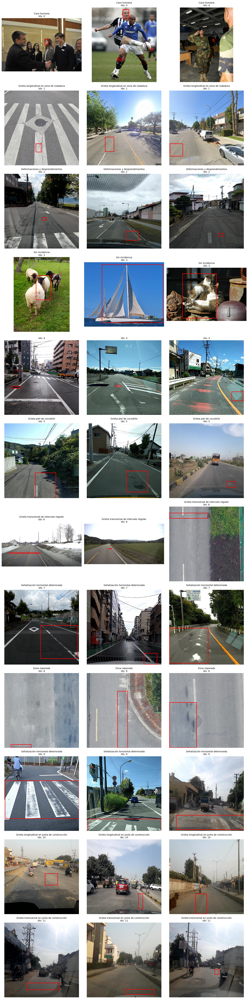

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def cargar_nombres_clases(path_txt):
    clases_desc = {}
    with open(path_txt, 'r', encoding='utf-8') as f:
        for line in f:
            if line.strip():
                key, desc = line.strip().split('-', 1)
                clases_desc[key.strip()] = desc.strip()
    return clases_desc

def show_examples_por_clase_con_titulo(df, class_to_idx, path_txt, n_examples=3):
    clases_desc = cargar_nombres_clases(path_txt)
    n_classes = len(class_to_idx)
    
    plt.figure(figsize=(n_examples * 5, n_classes * 5))

    for i, (label, idx) in enumerate(class_to_idx.items()):
        subset = df[df['label'] == label]
        if subset.empty:
            continue

        n_show = min(n_examples, len(subset))
        samples = subset.sample(n_show)

        for j, (_, sample) in enumerate(samples.iterrows()):
            img_path = sample['image_path']
            xmin, ymin, xmax, ymax = sample['xmin'], sample['ymin'], sample['xmax'], sample['ymax']

            img = Image.open(img_path)

            ax = plt.subplot(n_classes, n_examples, i * n_examples + j + 1)
            ax.imshow(img)
            rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                     linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

            desc = clases_desc.get(str(label), f"{label} (sin descripción)")
            ax.set_title(f"{desc}\nIdx: {idx}", fontsize=10)
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# Uso
path_clases = 'clases_extraidas.txt'  # Ajusta si está en otra carpeta
show_examples_por_clase_con_titulo(df_balanced, class_to_idx, path_clases, n_examples=3)
